Importing packages:

In [3]:
import segyio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
plt.style.use("seaborn")
from skimage.io import imsave, imread
import pandas as pd

In [6]:
import os
os.chdir('/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/')

Reading the seismic data - example:

In [7]:
!ls

 L11a.sgy			     L12.sgy	     L19.sgy
 L11b_fixed.sgy			    'L13(1).sgy'    'L20a(1).sgy'
 L11b.sgy			    'L14ab(1).sgy'  'L20b(2).sgy'
 L11b_TOMOKO.sgy		     L14c.sgy	     picks_from_OpendTect
 L12ab.sgy			     L15.sgy	     shapefiles_lithoprobe
 L12cd.sgy			     L16.sgy	     txt_files
 L12F.sgy			     L17.sgy
 l12_segp1_coords_calculation.xlsx   L18.sgy


In [10]:
example_segy = "L11a.sgy"


# L12
# # example_segy = "L12.sgy"
# with segyio.open(example_segy, ignore_geometry=True) as f:
#     print("YAY")
#     
#     print("Bouguer Gravity:", (f.header[1000][189]))
#     print("Isostatic:", (f.header[1000][193]))
#     print("Magnetic Anomaly:", (f.header[1000][197]))
#     print("Number of traces in the segy:", len(f.header))

YAY


In [754]:
seismic_line =  "L11a.sgy"

segyio.open(seismic_lines, ignore_geometry=True)
"""
info from the header:

POTENTIAL FIELD DATA: BOUGUER GRAVITY: WORD 16 (SEGY 189)
ISOSTATIC: WORD 17 (SEGY 193)                .
MAGNETIC ANOM.: WORD 18 (SEGY 197) 

f.header[trace_number][header_field_number]))
"""

###### f.header[trace_number][header_field_number]))

segy_vals = {}
xcdp = []
gravity_vals = []
isostatic_vals = []
magnetic_vals = []
cdp = []
sx = []
sy = []
line_nums = []

with segyio.open(seismic_line, ignore_geometry=True) as f:
#     print(f.header[1][33])
    #line_num = fseis[:-4]
    for i in range(len(f.header)):
        gravity_vals.append(f.header[i][189])
#         cdp.append(f.header[i][21])
        xcdp.append(f.header[i][181])
#         print(f.header[i][33])
#         isostatic_vals.append(f.header[i][193])
#         line_nums.append(line_num)
#         sx.append(f.header[i][73])
#         sy.append(f.header[i][77])

# df = pd.DataFrame({'Bouguer_anomaly':gravity_vals, 'isostatic':isostatic_vals, 'cdp':cdp,'sx':sx,'sy':sy,'line_num':line_nums})
# df = df[df['Bouguer_anomaly']!=0]


In [ ]:
df.line_num.unique()

In [ ]:
# line11a_df = df[df['line_num']=='L11a']
# line11b_df = df[df['line_num']=='L11b']
# line12_df = df[df['line_num']=='L12']
# line13_df = df[df['line_num']=='L13(1)']

# plt.subplot(221)
# plt.plot(line11a_df.cdp, line11a_df.Bouguer_anomaly)
# plt.title('line11a')

# plt.subplot(222)
# plt.plot(line11b_df.cdp, line11b_df.Bouguer_anomaly)
# plt.title('line11b')

# plt.subplot(223)
# plt.plot(line12_df.cdp, line12_df.Bouguer_anomaly)
# plt.title('line12')

# plt.subplot(224)
# plt.plot(line13_df.cdp, line13_df.Bouguer_anomaly)
# plt.title('line13')

# plt.show;

Further manipulations as described in https://github.com/equinor/segyio-notebooks/blob/master/notebooks/basic/02_segy_quicklook.ipynb

In [17]:
import re

def parse_trace_headers(segyfile, n_traces):
    '''
    Parse the segy file trace headers into a pandas dataframe.
    Column names are defined from segyio internal tracefield
    One row per trace
    '''
    # Get all header keys
    headers = segyio.tracefield.keys
    # Initialize dataframe with trace id as index and headers as columns
    df = pd.DataFrame(index=range(1, n_traces + 1),
                      columns=headers.keys())
    # Fill dataframe with all header values
    for k, v in headers.items():
        df[k] = segyfile.attributes(v)[:]
    return df

def parse_text_header(segyfile):
    '''
    Format segy text header into a readable, clean dict
    '''
    raw_header = segyio.tools.wrap(segyfile.text[0])
    # Cut on C*int pattern
    cut_header = re.split(r'C ', raw_header)[1::]
    # Remove end of line return
    text_header = [x.replace('\n', ' ') for x in cut_header]
    text_header[-1] = text_header[-1][:-2]
    # Format in dict
    clean_header = {}
    i = 1
    for item in text_header:
        key = "C" + str(i).rjust(2, '0')
        i += 1
        clean_header[key] = item
    return clean_header

In [965]:
fseis = "L11a.sgy"
with segyio.open(fseis, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) /1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

'N Traces: 4624, N Samples: 4501, Sample rate: 4.0ms'

Let's use trace header from the SEGY file to access the necessary coordinates

Additional codes if we neet to do some additional work using the columns from seismic header

In [966]:
# print(coords_df.shape)# print("Number of unique CDP numbers:", len(trace_headers.CDP.unique()))
# print("Number of all traces:", len(trace_headers))
# print("Number of unique SP:", len(trace_headers.ShotPoint.unique()))
print(trace_headers[['SourceDepth']].min() /100)
print(trace_headers[['SourceDepth']].max())
print(trace_headers[['SourceY']].max())


SourceDepth    280984.0
dtype: float64
SourceDepth    33291300
dtype: int32
SourceY    6201652
dtype: int32


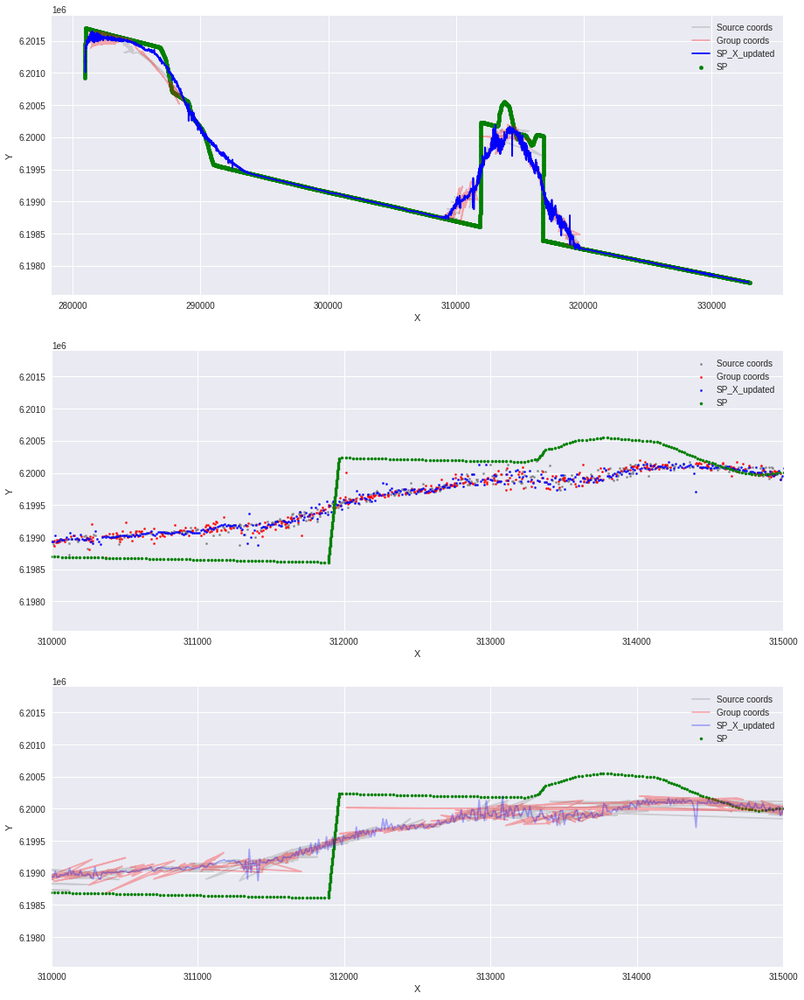

In [1056]:
trace_headers["SourceX_updated"] = trace_headers["SourceDepth"] / 100

# print(trace_headers_valid.head())
# coef1 = coords_df.iloc[-1,0] - coords_df[1][0] / len(coords_df)

mul_coef = (trace_headers['CDP'].iloc[-1] - trace_headers['CDP'].iloc[0]) / (coords_df['SP'].iloc[-1] - coords_df['SP'].iloc[0])
mul_coef

first_tr_index = trace_headers['CDP'].iloc[0]

coords_df["SP_index"] = coords_df.index
coords_df["Tr_index_interp"] = first_tr_index + coords_df["SP_index"] * mul_coef
coords_df["Tr_index_interp_int"] = coords_df["Tr_index_interp"].astype(int)

fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize=(15,20))
ax2.set_xlim(310000,315000)
ax3.set_xlim(310000,315000)

x1 = trace_headers.plot.line(x='SourceX', y='SourceY', c='grey',ax = ax1, alpha=0.3, label="Source coords")
x2 = trace_headers.plot.line(x='GroupX', y='GroupY', c='Red',ax = ax1, alpha=0.3, label="Group coords")
x3 = trace_headers.plot.line(x='SourceX_updated', y='SourceY', c='blue',ax = ax1, label="SP_X_updated")
x4 = coords_df.plot.scatter(x = 'X', y="Y", c="g", ax=ax1, label="SP")

x1 = trace_headers.plot.scatter(x='SourceX', y='SourceY', c='grey',ax = ax2,s=5, label="Source coords")
x2 = trace_headers.plot.scatter(x='GroupX', y='GroupY', c='Red',ax = ax2,s=5,label="Group coords")
x3 = trace_headers.plot.scatter(x='SourceX_updated', y='SourceY', c='blue',ax = ax2,s=5, label="SP_X_updated")
x4 = coords_df.plot.scatter(x = 'X', y="Y", c="g", ax=ax2, s=10, label="SP")

x1 = trace_headers.plot.line(x='SourceX', y='SourceY', c='grey',ax = ax3,alpha=0.3, label="Source coords")
x2 = trace_headers.plot.line(x='GroupX', y='GroupY', c='Red',ax = ax3, alpha=0.3, label="Group coords")
x3 = trace_headers.plot.line(x='SourceX_updated', y='SourceY', c='blue', ax = ax3,alpha=0.3, label="SP_X_updated")
x4 = coords_df.plot.scatter(x = 'X', y="Y", c="g", ax=ax3, s=10, label="SP")



plt.show()


# trace_headers_valid[["GroupX","SourceX", "SourceX_v2"]].head()

We see that the coordinates from column Source_X_updated gives us the best results. We can import the coordinates from the SEGP1 file, however they give the location of the shotpoint. 

In [883]:
coords_df = pd.read_csv('txt_files/OpendTect/line_11.txt', header=None, sep=" ", names=['SP','X','Y'])

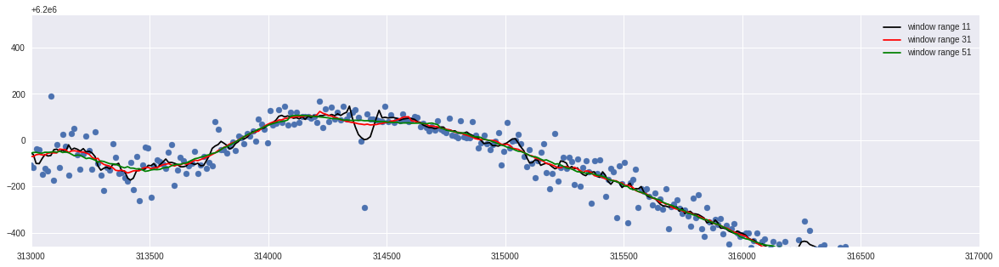

In [921]:
from scipy.signal import savgol_filter
import numpy as np
import matplotlib.pyplot as plt

xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

fig, ax = plt.subplots(figsize=(20,5))

ax.set_xlim(313000,317000)
ax.set_ylim(6199540.072819445, 6200540)
colors = ['red','green','black']
windows = range(11, 101,20)

for i in range(0, len(colors)):
    yhat = savgol_filter(ys, windows[i], 3) # window size 51, polynomial order 3
    ax.plot(xs,yhat, color=colors[i-1], label="window range " + str(windows[i]))

ax.legend()
ax.scatter(xs, ys)
plt.show()


We decide to use the window size 51 as that approximates well the scatter CDP plots, producing nice, smooth line.

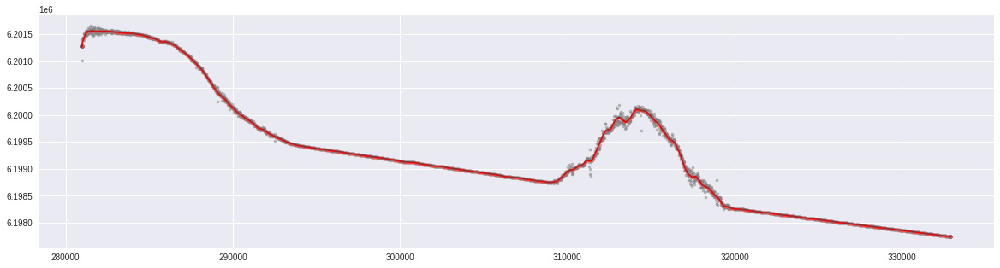

In [931]:
fig, ax = plt.subplots(figsize=(20,5))

xs = trace_headers_valid["SourceX_updated"]
ys = trace_headers_valid["SourceY"]

yhat = savgol_filter(ys, 51, 3) 

ax.scatter(xs, ys, s=10, c='grey', alpha=0.5)
ax.plot(xs, yhat,c='red');


Export the results to dataframe

In [899]:
frame = {'Trace_number':xs.index, 'X_new': xs, 'Y_new': yhat} 
# new_df[['Trace_number','X_new','Y_new']].to_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/geometry/11A_smoothed_geometry.txt", index = False, header=False, sep = ' ')

Work on the next line: L11b.segy

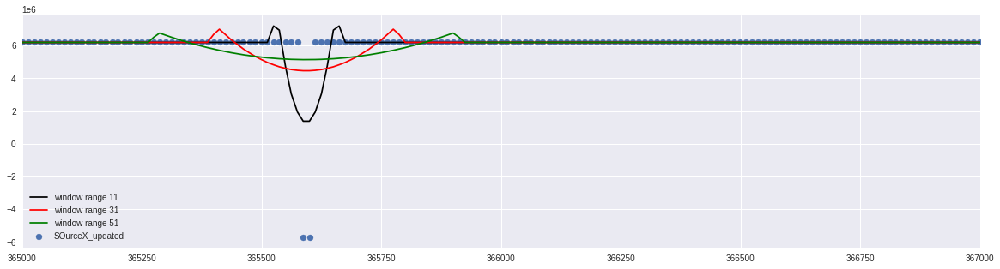

In [1157]:
fseis = "L11b.sgy"
with segyio.open(fseis, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) /1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

trace_headers["SourceX_updated"] = trace_headers["SourceDepth"] / 100
# idx_to_update = trace_headers[trace_headers["SourceY"] < 0].index
# trace_headers.apply(lambda: x = x*(-1) if trace_headers["SourceY"] < 0 )

# trace_headers['SourceY'].mask(trace_headers['SourceY'] < 0, trace_headers['SourceY']*(-1))
# print(list(idx_to_update))

# df.at[1,'SourceY']=50

# df.loc[df.filename == 'test2.dat', 'n'] = df2[df2.filename == 'test2.dat'].loc[0]['n']
# trace_headers["SourceY"].min()
xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

fig, ax = plt.subplots(figsize=(20,5))

ax.set_xlim(365000, 367000)
# ax.set_ylim(6199540.072819445, 6200540)
colors = ['red','green','black']
windows = range(11, 101,20)

for i in range(0, len(colors)):
    yhat = savgol_filter(ys, windows[i], 3) # window size 51, polynomial order 3
    ax.plot(xs,yhat, color=colors[i-1], label="window range " + str(windows[i]))

ax.scatter(xs, ys, label="SourceX_updated")
ax.legend()

plt.show()


There's a problem with a few data points, we can check that there are 2 points with negative values of the y coordinate:

In [1273]:
sum(trace_headers["SourceY"] < 0)
trace_headers[trace_headers["SourceY"] < 0]["SourceY"]


3030   -5738060
3031   -5737873
Name: SourceY, dtype: int32

It's completely wrong. We need to interpolate the value based on the other points in the vicinity.

In [1144]:
# trace_headers["SourceY"].max()

6194592

362    6.192167e+06
Name: SourceY_updated, dtype: float64 375    6.192167e+06
Name: SourceY_updated, dtype: float64


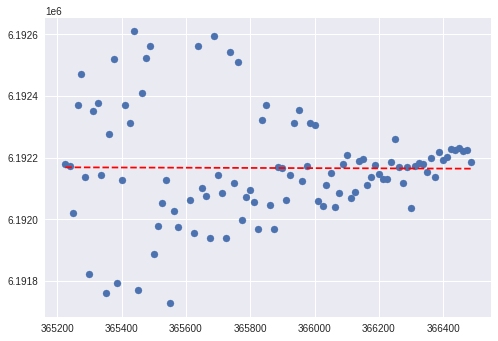

In [1259]:
# fit a second degree polynomial to the data
from numpy import arange
from scipy.optimize import curve_fit
 
# define the true objective function
def objective(x, a, b):
    return a * x + b

# choose the input and output variables
df_interp = trace_headers[trace_headers["SourceY"] > 0]
x = df_interp["SourceX_updated"][3000:3100]
y = df_interp["SourceY"][3000:3100]

# curve fit
popt, _ = curve_fit(objective, x, y)
# summarize the parameter values
a, b = popt
# print('y = %.5f * x + %.5f * x' % (a, b))
# plot input vs output
plt.scatter(x, y)
# define a sequence of inputs between the smallest and largest known inputs
x_line = arange(min(x), max(x), 1)
# calculate the output for the range
y_line = objective(x_line, a, b)
# create a line plot for the mapping function
plt.plot(x_line, y_line, '--', color='red')
# plt.show()
frame = {"SourceX_updated":x_line, "SourceY_updated":y_line}
dataframe = pd.DataFrame(frame)
wrong_coords = trace_headers[trace_headers["SourceY"] < 0]["SourceX_updated"]

trace_headers["SourceY_updated"] = trace_headers["SourceY"]

ynew_3030 = dataframe[dataframe["SourceX_updated"] == wrong_coords.to_list()[0]]["SourceY_updated"]
ynew_3031 = dataframe[dataframe["SourceX_updated"] == wrong_coords.to_list()[1]]["SourceY_updated"]

trace_headers.at[3030, "SourceY_updated"] = ynew_3030
trace_headers.at[3031, "SourceY_updated"] = ynew_3031
print(ynew_3030,ynew_3031)

Let's plot it again

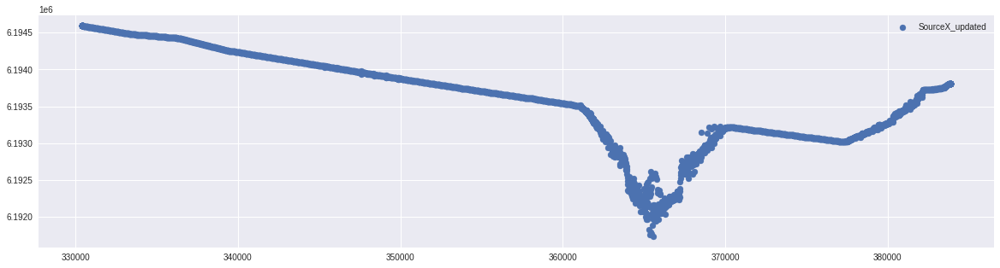

In [1261]:
xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY_updated"]

fig, ax = plt.subplots(figsize=(20,5))

# ax.set_xlim(365000, 367000)
# ax.set_ylim(6199540.072819445, 6200540)
colors = ['red','green','black']
windows = range(11, 101,20)

# for i in range(0, len(colors)):
#     yhat = savgol_filter(ys, windows[i], 3) # window size 51, polynomial order 3
#     ax.plot(xs,yhat, color=colors[i-1], label="window range " + str(windows[i]))

ax.scatter(xs, ys, label="SourceX_updated")
ax.legend()

plt.show()

Now we can fint the smoothed curve. Lets increase the smoothing to 101 as the CDP coordinates are pretty scattered around X = 3650000

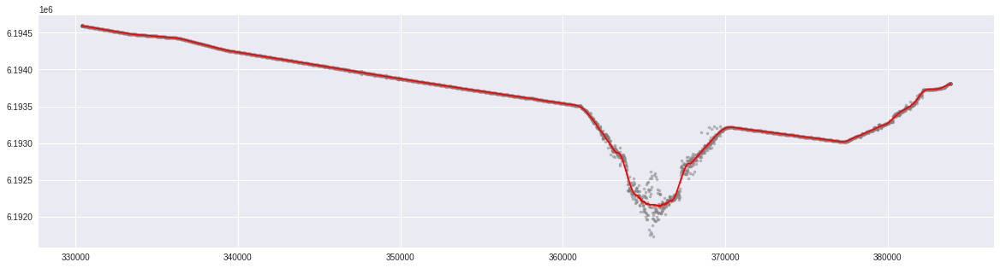

In [1271]:
fig, ax = plt.subplots(figsize=(20,5))

xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY_updated"]

yhat = savgol_filter(ys, 101, 3) 

ax.scatter(xs, ys, s=10, c='grey', alpha=0.5)
ax.plot(xs, yhat,c='red');

Export the updated coordinates

In [1276]:
frame = {'Trace_number':xs.index, 'X_new': xs, 'Y_new': yhat} 
new_df = pd.DataFrame(frame)
new_df[['Trace_number','X_new','Y_new']].to_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/geometry/11B_smoothed_geometry.txt", index = False, header=False, sep = ' ')

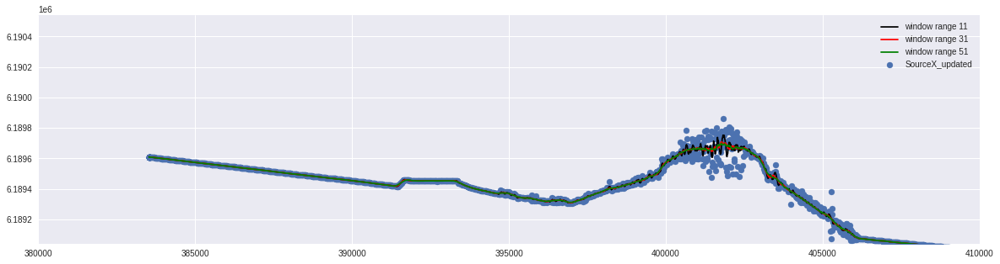

In [1288]:
fseis = "L12.sgy"
with segyio.open(fseis, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) /1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

trace_headers["SourceX_updated"] = trace_headers["SourceDepth"] / 100
# idx_to_update = trace_headers[trace_headers["SourceY"] < 0].index
# trace_headers.apply(lambda: x = x*(-1) if trace_headers["SourceY"] < 0 )

# trace_headers['SourceY'].mask(trace_headers['SourceY'] < 0, trace_headers['SourceY']*(-1))
# print(list(idx_to_update))

# df.at[1,'SourceY']=50

# df.loc[df.filename == 'test2.dat', 'n'] = df2[df2.filename == 'test2.dat'].loc[0]['n']
# trace_headers["SourceY"].min()
xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

fig, ax = plt.subplots(figsize=(20,5))

ax.set_xlim(380000, 410000)
ax.set_ylim(6189040.072819445, 6190540)
colors = ['red','green','black']
windows = range(11, 101,20)

for i in range(0, len(colors)):
    yhat = savgol_filter(ys, windows[i], 3) # window size 51, polynomial order 3
    ax.plot(xs,yhat, color=colors[i-1], label="window range " + str(windows[i]))

ax.scatter(xs, ys, label="SourceX_updated")
ax.legend()

plt.show()


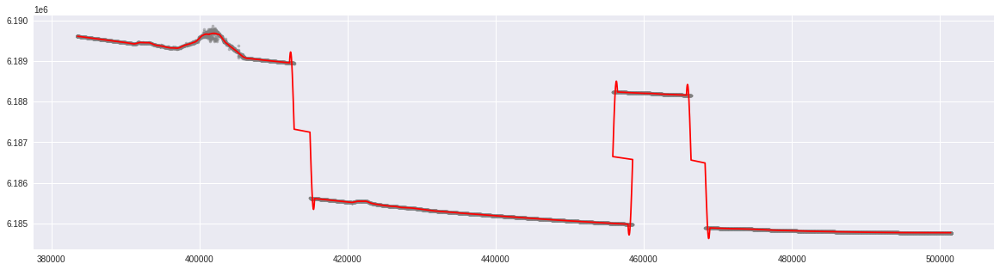

In [1290]:
fig, ax = plt.subplots(figsize=(20,5))

xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

yhat = savgol_filter(ys, 101, 3) 

ax.scatter(xs, ys, s=10, c='grey', alpha=0.5)
ax.plot(xs, yhat,c='red');

In [ ]:
frame = {'Trace_number':xs.index, 'X_new': xs, 'Y_new': yhat} 
new_df = pd.DataFrame(frame)
new_df[['Trace_number','X_new','Y_new']].to_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/geometry/12AB_smoothed_geometry.txt", index = False, header=False, sep = ' ')

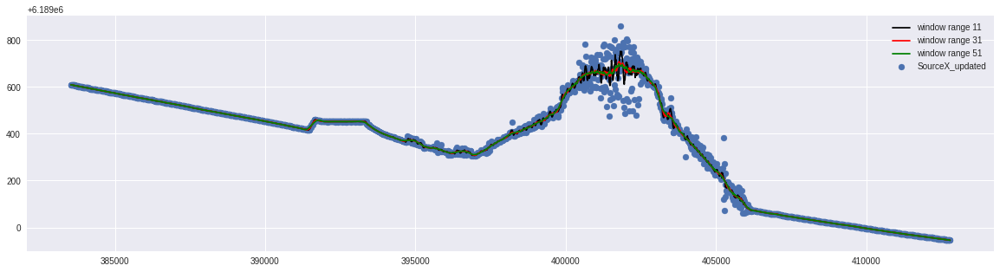

In [1294]:
fseis = "L12ab.sgy"
with segyio.open(fseis, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) /1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

trace_headers["SourceX_updated"] = trace_headers["SourceDepth"] / 100
# idx_to_update = trace_headers[trace_headers["SourceY"] < 0].index
# trace_headers.apply(lambda: x = x*(-1) if trace_headers["SourceY"] < 0 )

# trace_headers['SourceY'].mask(trace_headers['SourceY'] < 0, trace_headers['SourceY']*(-1))
# print(list(idx_to_update))

# df.at[1,'SourceY']=50

# df.loc[df.filename == 'test2.dat', 'n'] = df2[df2.filename == 'test2.dat'].loc[0]['n']
# trace_headers["SourceY"].min()
xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

fig, ax = plt.subplots(figsize=(20,5))

# ax.set_xlim(380000, 410000)
# ax.set_ylim(6189040.072819445, 6190540)
colors = ['red','green','black']
windows = range(11, 101,20)

for i in range(0, len(colors)):
    yhat = savgol_filter(ys, windows[i], 3) # window size 51, polynomial order 3
    ax.plot(xs,yhat, color=colors[i-1], label="window range " + str(windows[i]))

ax.scatter(xs, ys, label="SourceX_updated")
ax.legend()

plt.show()


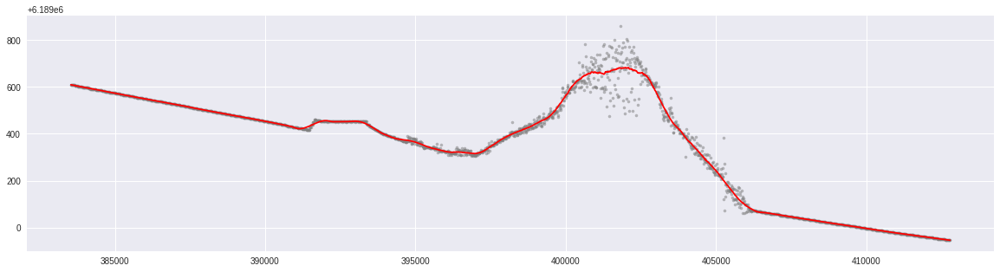

In [1297]:
fig, ax = plt.subplots(figsize=(20,5))

xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

yhat = savgol_filter(ys, 101, 3) 

ax.scatter(xs, ys, s=10, c='grey', alpha=0.5)
ax.plot(xs, yhat,c='red');

In [1298]:
frame = {'Trace_number':xs.index, 'X_new': xs, 'Y_new': yhat} 
new_df = pd.DataFrame(frame)
new_df[['Trace_number','X_new','Y_new']].to_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/geometry/12AB_smoothed_geometry.txt", index = False, header=False, sep = ' ')

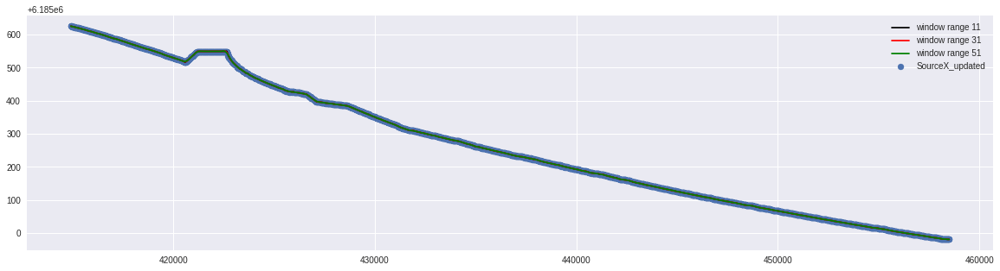

In [1309]:
fseis = "L12cd.sgy"
with segyio.open(fseis, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) /1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

trace_headers["SourceX_updated"] = trace_headers["SourceDepth"] / 100
# idx_to_update = trace_headers[trace_headers["SourceY"] < 0].index
# trace_headers.apply(lambda: x = x*(-1) if trace_headers["SourceY"] < 0 )

# trace_headers['SourceY'].mask(trace_headers['SourceY'] < 0, trace_headers['SourceY']*(-1))
# print(list(idx_to_update))

# df.at[1,'SourceY']=50

# df.loc[df.filename == 'test2.dat', 'n'] = df2[df2.filename == 'test2.dat'].loc[0]['n']
# trace_headers["SourceY"].min()
xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

fig, ax = plt.subplots(figsize=(20,5))

# ax.set_xlim(380000, 410000)
# ax.set_ylim(6189040.072819445, 6190540)
colors = ['red','green','black']
windows = range(11, 101,20)

for i in range(0, len(colors)):
    yhat = savgol_filter(ys, windows[i], 3) # window size 51, polynomial order 3
    ax.plot(xs,yhat, color=colors[i-1], label="window range " + str(windows[i]))

ax.scatter(xs, ys, label="SourceX_updated")
ax.legend()

plt.show()


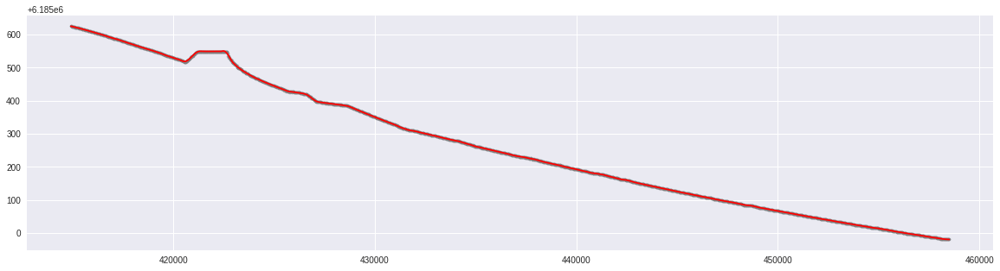

In [1310]:
fig, ax = plt.subplots(figsize=(20,5))

xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

yhat = savgol_filter(ys, 51, 3) 

ax.scatter(xs, ys, s=10, c='grey', alpha=0.5)
ax.plot(xs, yhat,c='red');

In [1311]:
frame = {'Trace_number':xs.index, 'X_new': xs, 'Y_new': yhat} 
new_df = pd.DataFrame(frame)
new_df[['Trace_number','X_new','Y_new']].to_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/geometry/12CD_smoothed_geometry.txt", index = False, header=False, sep = ' ')

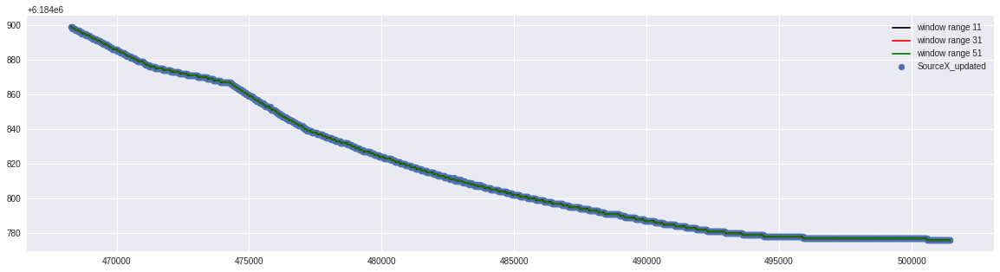

In [1304]:
fseis = "L12F.sgy"
with segyio.open(fseis, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) /1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

trace_headers["SourceX_updated"] = trace_headers["SourceDepth"] / 100
# idx_to_update = trace_headers[trace_headers["SourceY"] < 0].index
# trace_headers.apply(lambda: x = x*(-1) if trace_headers["SourceY"] < 0 )

# trace_headers['SourceY'].mask(trace_headers['SourceY'] < 0, trace_headers['SourceY']*(-1))
# print(list(idx_to_update))

# df.at[1,'SourceY']=50

# df.loc[df.filename == 'test2.dat', 'n'] = df2[df2.filename == 'test2.dat'].loc[0]['n']
# trace_headers["SourceY"].min()
xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

fig, ax = plt.subplots(figsize=(20,5))

# ax.set_xlim(380000, 410000)
# ax.set_ylim(6189040.072819445, 6190540)
colors = ['red','green','black']
windows = range(11, 101,20)

for i in range(0, len(colors)):
    yhat = savgol_filter(ys, windows[i], 3) # window size 51, polynomial order 3
    ax.plot(xs,yhat, color=colors[i-1], label="window range " + str(windows[i]))

ax.scatter(xs, ys, label="SourceX_updated")
ax.legend()

plt.show()


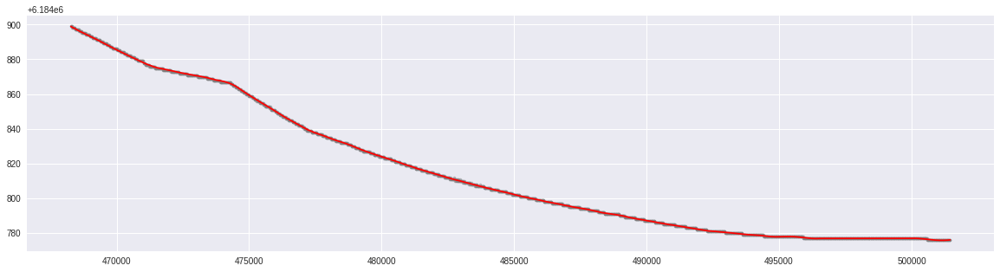

In [1305]:
fig, ax = plt.subplots(figsize=(20,5))

xs = trace_headers["SourceX_updated"]
ys = trace_headers["SourceY"]

yhat = savgol_filter(ys, 101, 3) 

ax.scatter(xs, ys, s=10, c='grey', alpha=0.5)
ax.plot(xs, yhat,c='red');

In [1306]:
frame = {'Trace_number':xs.index, 'X_new': xs, 'Y_new': yhat} 
new_df = pd.DataFrame(frame)
new_df[['Trace_number','X_new','Y_new']].to_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/geometry/12F_smoothed_geometry.txt", index = False, header=False, sep = ' ')

In [75]:
bin_headers

{JobID: 0, LineNumber: 0, ReelNumber: 1, Traces: 0, AuxTraces: 0, Interval: 4000, IntervalOriginal: 0, Samples: 4501, SamplesOriginal: 0, Format: 1, EnsembleFold: 0, SortingCode: 0, VerticalSum: 0, SweepFrequencyStart: 0, SweepFrequencyEnd: 0, SweepLength: 0, Sweep: 0, SweepChannel: 0, SweepTaperStart: 0, SweepTaperEnd: 0, Taper: 0, CorrelatedTraces: 0, BinaryGainRecovery: 0, AmplitudeRecovery: 0, MeasurementSystem: 0, ImpulseSignalPolarity: 0, VibratoryPolarity: 0, ExtAuxTraces: 0, ExtSamples: 0, ExtSamplesOriginal: 0, ExtEnsembleFold: 0, SEGYRevision: 0, SEGYRevisionMinor: 0, TraceFlag: 0, ExtendedHeaders: 0}

In [76]:
text_headers

{'C01': 'ANOM.: WORD 18 (SEGY 197) .C21 .C22 .C23 .C24 .C25 .C26 .C27 .C28 .C29 .C30 .C31 .C32 .C33 .C34 .C35 .C36 .C37 .C38 .C39 .C40 END EBCDIC'}

Text(0.5, 1.0, 'L11a.sgy')

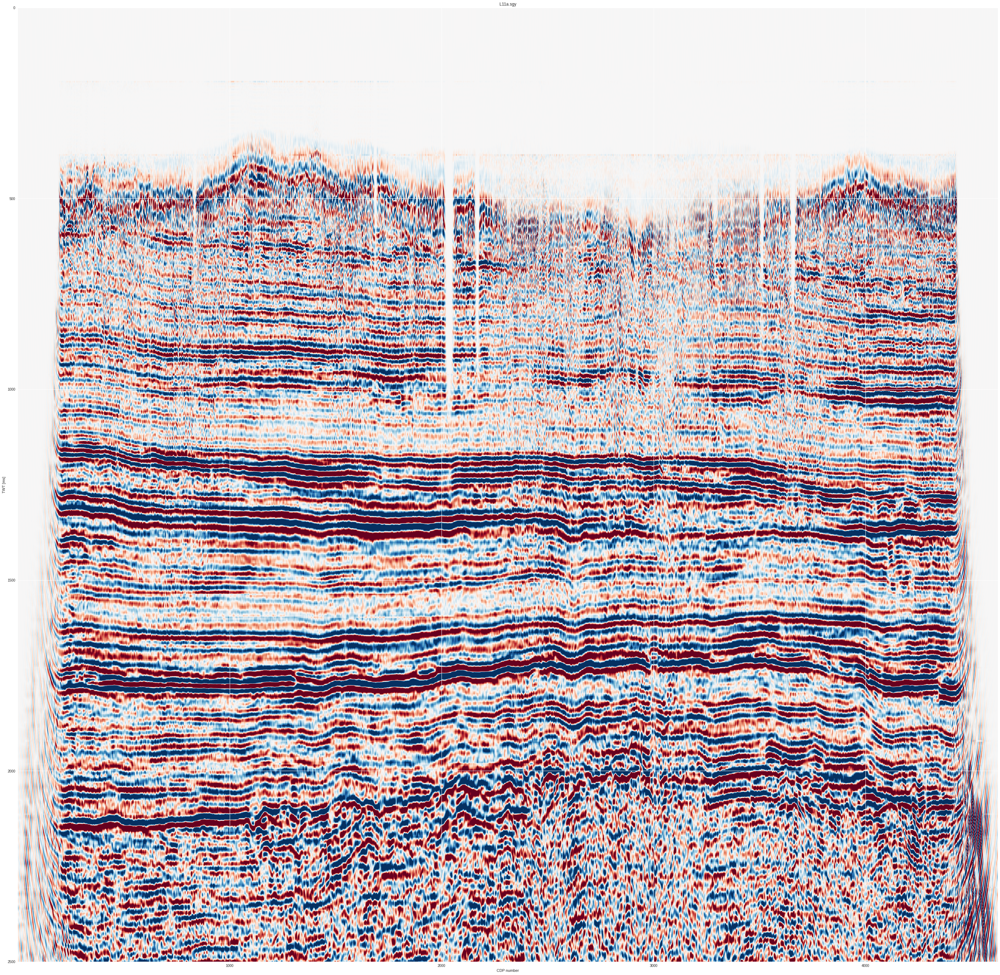

In [78]:
clip_percentile = 95
vm = np.percentile(data, clip_percentile)
f'The {clip_percentile}th percentile is {vm:.0f}; the max amplitude is {data.max():.0f}'

fig = plt.figure(figsize=(50, 50))
ax = fig.add_subplot(1, 1, 1)
extent = [1, n_traces, twt[-1], twt[0]]  # define extent
ax.imshow(data.T, cmap="RdBu", vmin=-vm, vmax=vm, aspect='auto', extent=extent)
ax.set_xlabel('CDP number')
ax.set_ylabel('TWT [ms]')
ax.set_ylim(2500, 0)
ax.set_title(f'{fseis}')

# fig.savefig('L11a_pictureab.jpg', dpi=300)

In [ ]:

fseis = "L12ab.sgy"
with segyio.open(fseis, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) /1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

clip_percentile = 99
vm = np.percentile(data, clip_percentile)
f'The {clip_percentile}th percentile is {vm:.0f}; the max amplitude is {data.max():.0f}'

fig = plt.figure(figsize=(200, 150))
ax = fig.add_subplot(1, 1, 1)
extent = [1, n_traces, twt[-1], twt[0]]  # define extent
ax.imshow(data.T, cmap="RdBu", vmin=-vm, vmax=vm, aspect='auto', extent=extent)
ax.set_xlabel('CDP number')
ax.set_ylabel('TWT [ms]')
ax.xaxis.grid(True, which='minor')
ax.set_ylim(2500, 0)
ax.set_title(f'{fseis}')
plt.savefig(fseis + ".jpg",dpi=300)

In [ ]:
print("line:", fseis)
print(trace_headers.CDP) 
print(trace_headers.GroupX)

In [ ]:
trace_headers.CDP 
trace_headers.GroupX

In [ ]:
list(trace_headers.columns)

In [ ]:

fseis = "L11a.sgy"
with segyio.open(fseis, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) /1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

clip_percentile = 99
vm = np.percentile(data, clip_percentile)
f'The {clip_percentile}th percentile is {vm:.0f}; the max amplitude is {data.max():.0f}'

fig = plt.figure(figsize=(200, 150))
ax = fig.add_subplot(1, 1, 1)
extent = [1, n_traces, twt[-1], twt[0]]  # define extent
ax.imshow(data.T, cmap="RdBu", vmin=-vm, vmax=vm, aspect='auto', extent=extent)
ax.set_xlabel('CDP number')
ax.set_ylabel('TWT [ms]')
ax.xaxis.grid(True, which='minor')
ax.set_ylim(2500, 0)
ax.set_title(f'{fseis}')

In [ ]:
'N Traces: 2346, N Samples: 4501, Sample rate: 4.0ms'

In [149]:
trace_headers.GroupX
501381.dista

SyntaxError: invalid syntax (<ipython-input-149-ce2dbab43370>, line 2)

<AxesSubplot:>

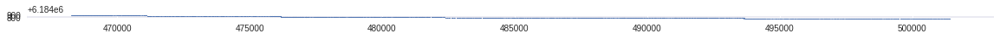

In [63]:
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd

# plt.scatter(trace_headers.GroupX,trace_headers.GroupY,s=1)

df = pd.DataFrame(
    {'X':list(trace_headers.GroupX),
     'Y': list(trace_headers.GroupY)})

gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.X, df.Y))
gdf['geometry'].set_crs(epsg=26711)
fig,ax = plt.subplots(figsize=(20,40))
gdf.plot(markersize=0.5, ax=ax)

In [71]:
f.header[197]

OSError: I/O operation on closed file

In [34]:
trace_headers.CDP_X

1       3102
2       3103
3       3104
4       3105
5       3104
        ... 
2650    4427
2651    4428
2652    4429
2653    4426
2654    4427
Name: CDP_X, Length: 2654, dtype: int32

In [155]:
set_crs(epsg=4326)

NameError: name 'set_crs' is not defined

In [162]:
import pandas as pd
# line12a = pd.read_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/OpendTect/line_12.txt", header=None)
line12ab = pd.read_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/OpendTect/line_12AB.txt", header=None, sep=' ')
line12c = pd.read_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/OpendTect/line_12C.txt", header=None, sep=' ')
line12d = pd.read_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/OpendTect/line_12D.txt", header=None, sep=' ')
line12x = pd.read_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/OpendTect/line_12X.txt", header=None, sep=' ')
line12f = pd.read_csv("/media/paulina/My Passport/NRCan/data/PRAISE_Lithoprobe/txt_files/OpendTect/line_12F.txt", header=None, sep=' ')




In [163]:
result = line12ab.append(line12c)
result = result.append(line12d)
result = result.append(line12x)
result = result.append(line12f)
result.rename(columns=({1:'X',2:'Y'}),inplace=True)
result.sort_values(by='X')
result['nr'] = range(1, len(result) + 1)

In [164]:
cols = result.columns.tolist()
cols = cols[-1:] + cols[:-1]
result = result[cols]
result = result.drop(columns=[0])
# result.reset_index(inplace=True, drop=False)

result.tail()

# result.to_csv("merged_coordinates_line12.txt", sep=' ', index=False, header=False)

,nr,X,Y
1327,4610,501430.5,6184776.1
1328,4611,501455.4,6184776.1
1329,4612,501480.3,6184776.0
1330,4613,501505.2,6184776.0
1331,4614,501530.1,6184776.0


In [159]:

4614*2

9228

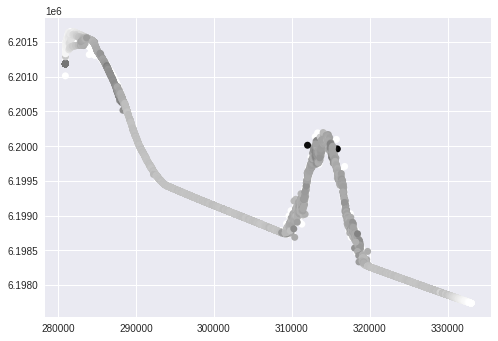

In [27]:
filename = 'L11a.sgy'
with segyio.open(filename, ignore_geometry=True) as segyfile:
    segyfile.mmap()

    # Extract header word for all traces
    sourceX = segyfile.attributes(segyio.TraceField.SourceX)[:]

    # Scatter plot sources and receivers color-coded on their number
    plt.figure()
    sourceY = segyfile.attributes(segyio.TraceField.SourceY)[:]
    nsum = segyfile.attributes(segyio.TraceField.NSummedTraces)[:]
    plt.scatter(sourceX, sourceY, c=nsum, edgecolor='none')

    groupX = segyfile.attributes(segyio.TraceField.GroupX)[:]
    groupY = segyfile.attributes(segyio.TraceField.GroupY)[:]
    nstack = segyfile.attributes(segyio.TraceField.NStackedTraces)[:]
    plt.scatter(groupX, groupY, c=nstack, edgecolor='none')